# Workshop - Day 1

Let's begin our data exploration.

![Exploring Data](files/im.jpg)

## Task 0 - User Setup

If you haven't already, please install plotly:
  1. Open a new terminal
  2. Please type in the terminal 'python3 --version' (don't include quotations) then hit enter. If the version you have version 3.12.2 you do not need to do these instructions. Otherwise please continue following the instructions.
  3. Please type in your terminal which folder you want to create your virtual environment. For example:
                  cd ~/Downloads
     then hit enter.
  5. Then type in your terminal 'python3 -m venv plotly_install' (don't include quotations) then hit enter.
  6. Then type in your terminal 'plotly_install/bin/activate' (don't include quotations) then hit enter.
  7. Then type in your terminal 'pip install plotly' (don't include quotations) then hit enter.
  8. Open your Jupyter Notebook, hit the 'Kernal' button at the top of screen. Then hit 'Change Kernal'. Then selection 'Python 3.12 (plotly)'.
     
You have successfuly installed plotly.

Before we visualize anything, let’s understand what’s in our datasets.

In [33]:
import pandas as pd
import plotly.express as px

patients_df = pd.read_csv("patients.csv")
observations_df = pd.read_csv("observations.csv")
conditions_df = pd.read_csv("conditions.csv")

patients_df.head()

,Id,BIRTHDATE,DEATHDATE,SSN,DRIVERS,PASSPORT,PREFIX,FIRST,LAST,SUFFIX,...,BIRTHPLACE,ADDRESS,CITY,STATE,COUNTY,ZIP,LAT,LON,HEALTHCARE_EXPENSES,HEALTHCARE_COVERAGE
0,b9c610cd-28a6-4636-ccb6-c7a0d2a4cb85,2019-02-17,NaN,999-65-3251,NaN,NaN,NaN,Damon455,Langosh790,NaN,...,Middleborough Massachusetts US,620 Lynch Tunnel Apt 0,Springfield,Massachusetts,Hampden County,1104.0,42.080389,-72.480431,9039.1645,7964.1255
1,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,2005-07-04,NaN,999-49-3323,S99941126,NaN,NaN,Thi53,Wunsch504,NaN,...,Danvers Massachusetts US,972 Tillman Branch Suite 48,Bellingham,Massachusetts,Norfolk County,NaN,42.035213,-71.482519,402723.4150,14064.1350
2,339144f8-50e1-633e-a013-f361391c4cff,1998-05-11,NaN,999-10-8743,S99996708,X75063318X,Mr.,Chi716,Greenfelder433,NaN,...,Athens Athens Prefecture GR,1060 Bernhard Crossroad Suite 15,Boston,Massachusetts,Suffolk County,2131.0,42.292557,-71.061160,571935.8725,787.5375
3,d488232e-bf14-4bed-08c0-a82f34b6a197,2003-01-28,NaN,999-56-6057,S99929424,NaN,Ms.,Phillis443,Walter473,NaN,...,Boston Massachusetts US,677 Ritchie Terrace,Hingham,Massachusetts,Plymouth County,2043.0,42.200491,-70.916076,582557.8030,104782.2070
4,217f95a3-4e10-bd5d-fb67-0cfb5e8ba075,1993-12-23,NaN,999-91-4320,S99991143,X44132498X,Mr.,Jerrold404,Herzog843,NaN,...,Boston Massachusetts US,276 Bernier Branch,Revere,Massachusetts,Suffolk County,NaN,42.381875,-70.999286,475826.8550,18067.0950


#### Exercise 1

This shows us the structure of patients.csv, which contains demographic and healthcare data. Try running .head() on the other two datasets!

### 0.1 Brief Data Summary

Let's explore the time ranges in our data.

In [36]:
observations_df['DATE'] = pd.to_datetime(observations_df['DATE'], errors='coerce')
conditions_df['START'] = pd.to_datetime(conditions_df['START'], errors='coerce')
conditions_df['STOP'] = pd.to_datetime(conditions_df['STOP'], errors='coerce')

In [37]:
print("Observation Date Range:")
print(observations_df['DATE'].min(), "→", observations_df['DATE'].max())

print("\nCondition Timeline:")
print(conditions_df['START'].min(), "→", conditions_df['STOP'].max())

Observation Date Range:
1932-06-21 11:58:49+00:00 → 2021-11-19 07:15:57+00:00

Condition Timeline:
1919-06-06 00:00:00 → 2021-11-18 00:00:00


Do any of the dates look strange or outdated? Can you trust data from the 1930s or 1940s? Why might it be there?

Let's view the most common entries!

In [40]:
# Top 5 most common observation types
observations_df['DESCRIPTION'].value_counts().head(5)

DESCRIPTION
Pain severity - 0-10 verbal numeric rating [Score] - Reported    14537
Diastolic Blood Pressure                                         14467
Systolic Blood Pressure                                          14467
Body Weight                                                      13275
Heart rate                                                       13014
Name: count, dtype: int64

In [41]:
# Top 5 most common medical conditions
conditions_df['DESCRIPTION'].value_counts().head(5)

DESCRIPTION
Full-time employment (finding)    13805
Stress (finding)                   5137
Part-time employment (finding)     2426
Social isolation (finding)         1243
Viral sinusitis (disorder)         1233
Name: count, dtype: int64

## Task 1 - Dataset Overview

Let’s explore different aspects of our patient population using a mix of interactive charts. Each one will give us insights into who the patients are and what kind of data is collected about them.

### 1.1 🧓 How Old Are Our Patients?
Let’s kick off with something fun and informative!  
We calculated the age of each patient using their birthdate.  

In [45]:
from datetime import datetime

In [46]:
patients_df['BIRTHDATE'] = pd.to_datetime(patients_df['BIRTHDATE'], errors='coerce')

# Calculate age manually
today = pd.to_datetime("today")
patients_df['AGE'] = (today - patients_df['BIRTHDATE']).dt.days // 365

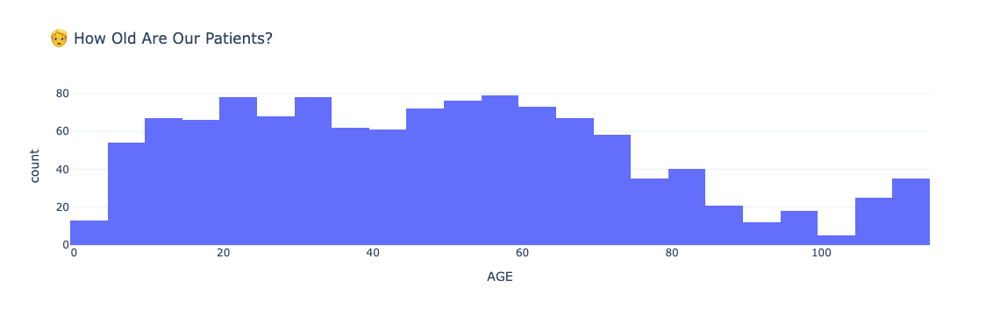

In [47]:
fig_age = px.histogram(patients_df, x='AGE', nbins=30, title='🧓 How Old Are Our Patients?', template='plotly_white')
fig_age.show()

### 1.2 Healthcare Expenses by Gender

Let’s analyze how healthcare expenses vary between male and female patients.

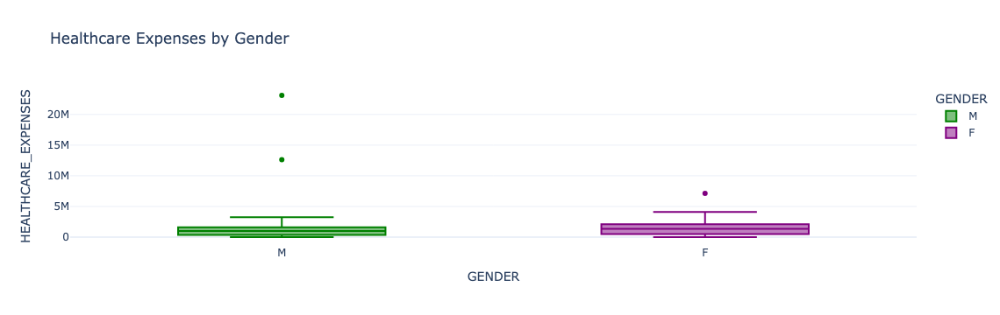

In [49]:
fig_expense = px.box(patients_df, x='GENDER', y='HEALTHCARE_EXPENSES',
                     title='Healthcare Expenses by Gender', template='plotly_white', color = 'GENDER', color_discrete_sequence=['green', 'purple'])
fig_expense.show()

Further down your data mining exploration, you will learn to handle outliers. At this time, let's just focus on understanding our dataset

#### Exercise 2
**Deeper Thinking Prompt:**

Without writing any code, imagine this:
> If we added a line that shows **average expenses** for each gender, would it fall inside the box or outside it? Why?

**Optional Code Prompt:**  
Try printing the first 10 rows where GENDER is `"female"`.  
What’s the range of expenses?


⬇Try it first! Then scroll for one possible solution.

In [53]:
### Put your answer here

In [54]:
patients_df[patients_df["GENDER"] == "F"].head(10)

,Id,BIRTHDATE,DEATHDATE,SSN,DRIVERS,PASSPORT,PREFIX,FIRST,LAST,SUFFIX,...,ADDRESS,CITY,STATE,COUNTY,ZIP,LAT,LON,HEALTHCARE_EXPENSES,HEALTHCARE_COVERAGE,AGE
1,c1f1fcaa-82fd-d5b7-3544-c8f9708b06a8,2005-07-04,NaN,999-49-3323,S99941126,NaN,NaN,Thi53,Wunsch504,NaN,...,972 Tillman Branch Suite 48,Bellingham,Massachusetts,Norfolk County,NaN,42.035213,-71.482519,4.027234e+05,14064.1350,20
3,d488232e-bf14-4bed-08c0-a82f34b6a197,2003-01-28,NaN,999-56-6057,S99929424,NaN,Ms.,Phillis443,Walter473,NaN,...,677 Ritchie Terrace,Hingham,Massachusetts,Plymouth County,2043.0,42.200491,-70.916076,5.825578e+05,104782.2070,22
5,faac724a-a9e9-be66-fe1e-3044dc0ba8ea,2020-12-04,NaN,999-31-8261,NaN,NaN,NaN,Brandon214,Watsica258,NaN,...,734 Brakus Pathway Unit 28,New Marlborough,Massachusetts,Berkshire County,NaN,42.147028,-73.217103,3.146804e+04,206.2200,4
8,0288c42c-43a1-9878-4a9d-6b96caa12c40,1979-12-17,NaN,999-68-7908,S99962050,X4451825X,Mrs.,Miki234,Kozey370,NaN,...,636 Stamm Gateway,Cambridge,Massachusetts,Middlesex County,2472.0,42.337425,-71.106655,1.134818e+06,226909.9595,45
10,61a2fcc0-d679-764c-7d86-b885b2c4907f,1993-01-22,NaN,999-98-2186,S99988392,X72124702X,Mrs.,Erline657,Metz686,NaN,...,566 Rosenbaum Ferry,Holbrook,Massachusetts,Norfolk County,NaN,42.151880,-70.952308,1.223458e+06,160.1400,32
11,c0219ca9-576f-f7c2-9c44-de030e94969b,1971-12-06,NaN,999-24-2120,S99951566,X2456540X,Mrs.,Beatriz277,Urías338,NaN,...,497 Bahringer Crossing,Somerville,Massachusetts,Middlesex County,2138.0,42.375785,-71.090397,1.509754e+06,968261.8390,53
12,cb8c092a-99aa-6c9c-1ec1-660f0b00549d,1990-12-28,NaN,999-74-6572,S99980075,X57149020X,Mrs.,Kari181,Douglas31,NaN,...,413 Auer Burg Suite 64,Wellesley,Massachusetts,Norfolk County,2457.0,42.330604,-71.308224,1.040518e+06,22454.9400,34
13,97a20cf9-630d-939c-2f50-f13c434aee2f,1984-03-23,NaN,999-16-8479,S99946662,X72015493X,Mrs.,Mayme605,Walter473,NaN,...,441 Rodriguez Bridge,Boston,Massachusetts,Suffolk County,2129.0,42.366924,-71.064831,1.622874e+06,74751.4725,41
14,55a6a46e-a1a4-0298-e58f-c0cb27cbb022,1958-09-18,2009-11-13,999-79-5115,S99956983,X26820988X,Mrs.,Maddie576,Gutmann970,NaN,...,577 Schmeler Frontage road Unit 7,Quincy,Massachusetts,Norfolk County,2169.0,42.314702,-71.027005,2.895618e+06,312276.3060,66
15,961f61f8-ed32-f113-8450-192064b49aa9,2002-06-13,NaN,999-91-5120,S99910835,NaN,Ms.,Jessia669,Wisoky380,NaN,...,106 Kerluke Rest Apt 5,Abington,Massachusetts,Plymouth County,2351.0,42.154079,-70.957996,4.853136e+05,1825.0800,23


### 1.3 📊 Top 10 Most Common Observations

This bar chart shows the most frequently recorded observations—vital signs, lab tests, screenings, etc.

**📝 Insight Prompt:**  
Think of this as your dataset’s "clinical heartbeat."

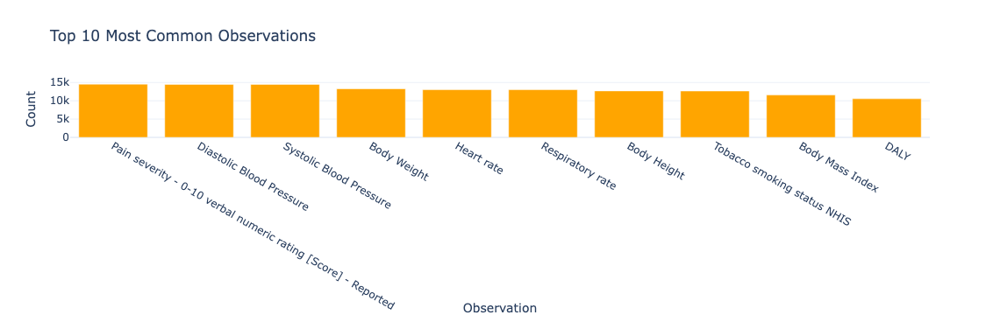

In [56]:
top_obs = observations_df['DESCRIPTION'].value_counts().head(10).reset_index()
top_obs.columns = ['Observation', 'Count']
fig_obs = px.bar(top_obs, x='Observation', y='Count', title='Top 10 Most Common Observations', template='plotly_white', color_discrete_sequence=['orange'])
fig_obs.show()

### 1.4 🦠 Top 10 Diagnosed Conditions

This chart shows the most commonly diagnosed conditions in the dataset.

**📝 What to Notice:**  
Are most of these chronic (long-term) or acute (short-term) issues?

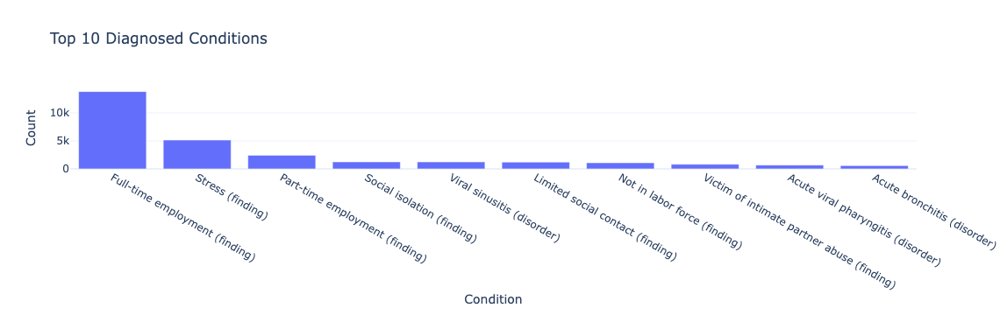

In [58]:
top_cond = conditions_df['DESCRIPTION'].value_counts().head(10).reset_index()
top_cond.columns = ['Condition', 'Count']
fig_cond = px.bar(top_cond, x='Condition', y='Count', title='Top 10 Diagnosed Conditions', template='plotly_white')
fig_cond.show()

### 1.5 🧬 Race Distribution of Patients

The pie chart reflects the racial diversity (or lack thereof) in the dataset.

Demographic representation affects the generalizability of research findings.

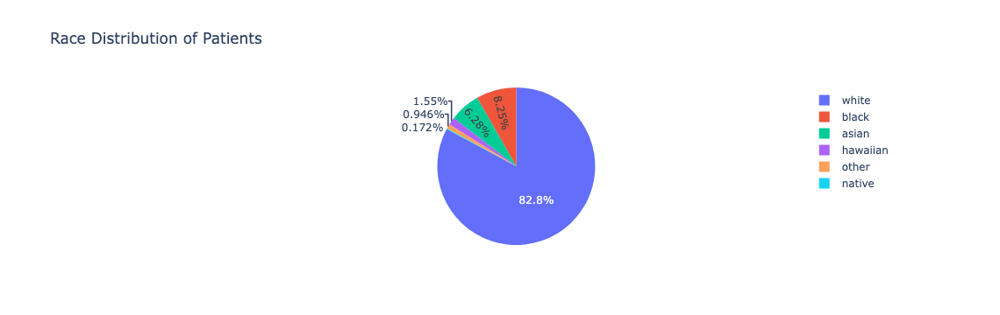

In [60]:
race_pie = patients_df['RACE'].value_counts().reset_index()
race_pie.columns = ['Race', 'Count']
fig_pie = px.pie(race_pie, values='Count', names='Race', title='Race Distribution of Patients')
fig_pie.show()

#### Exercise 3
**Reflective Prompt:**

How might the racial distribution in this dataset influence the types of conditions, screenings, or treatments most commonly recorded?
Could it affect how we interpret healthcare usage or disparities in outcomes?

### 1.6 Age vs. Healthcare Expenses

This scatter plot shows the relationship between a patient’s age and how much they spend on healthcare.

**What to Notice:**  
Do older patients seem to have higher expenses overall?

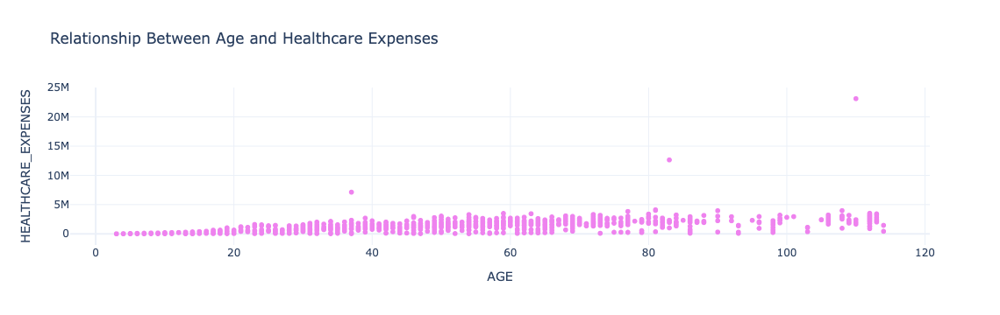

In [63]:
fig_scatter = px.scatter(patients_df, x='AGE', y='HEALTHCARE_EXPENSES',
                         title='Relationship Between Age and Healthcare Expenses',
                         template='plotly_white', color_discrete_sequence=['violet'])
fig_scatter.show()

#### Exercise 4
Let’s zoom in on patients over the age of 65 — a group often eligible for Medicare.

Can you create a scatter plot that shows the relationship between age and healthcare expenses only for patients aged 65 and above?

> Bonus 🧠: Once filtered, what patterns do you notice — is spending higher or more variable in older patients?

> Hint: try using patients_df[patients_df['AGE'] >= 65]

⬇Try it first! Then scroll for one possible solution.

In [65]:
### Put your answer here

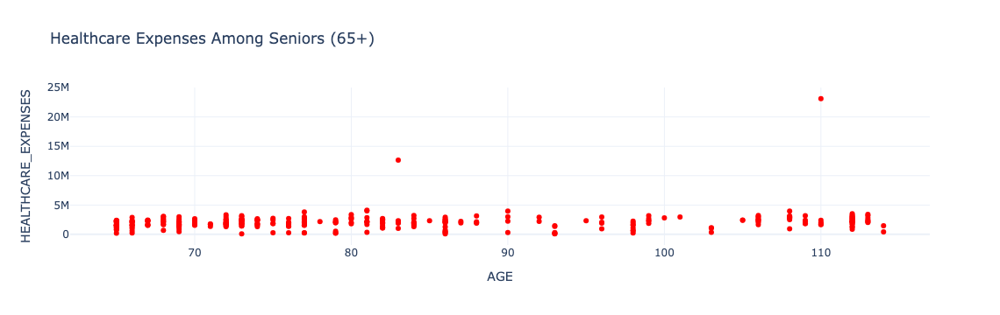

In [66]:
fig_senior = px.scatter(
    patients_df[patients_df['AGE'] >= 65],
    x='AGE',
    y='HEALTHCARE_EXPENSES',
    title='Healthcare Expenses Among Seniors (65+)',
    template='plotly_white',
    color_discrete_sequence=['red']
)
fig_senior.show()

## Task 2 - Exploring Conditions Over Time

**Goal**:
Understand when conditions occurred, who they affected, and whether there are age patterns or high-frequency diagnoses.

### 2.1 Top 5 Diagnosed Conditions (Table)

**What Is merged_df and Why Do We Create It?**

To better understand how patient demographics relate to their medical conditions, we need to combine both datasets:

The **patients.csv** file contains demographic information like age, gender, and birthdate.

The **conditions.csv** file contains diagnosis data, including the condition type and when it started.

By merging these two datasets, we can analyze trends like:

 - Do certain conditions appear more in older patients?

 - Are some conditions gender-skewed?

 - When are these conditions typically diagnosed?

This merged view allows richer visualizations and more meaningful insights.

In [71]:
# Merge patient demographics with condition records
merged_df = conditions_df.merge(
    patients_df[['Id', 'GENDER', 'AGE']],  # only selecting relevant columns
    left_on='PATIENT',
    right_on='Id',
    how='left'
)

# Drop any rows where condition start date or description is missing
merged_df.dropna(subset=['START', 'DESCRIPTION'], inplace=True)

In [72]:
top_conditions = merged_df['DESCRIPTION'].value_counts().head(5).reset_index()
top_conditions.columns = ['Condition', 'Count']
top_conditions

,Condition,Count
0,Full-time employment (finding),13805
1,Stress (finding),5137
2,Part-time employment (finding),2426
3,Social isolation (finding),1243
4,Viral sinusitis (disorder),1233


#### Exercise 5
**Engaging Prompt:**

Why do you think these conditions are the most frequently diagnosed? Are they chronic, common, or possibly over-diagnosed?

### 2.2 Boxplot — Age Distribution of Top Conditions

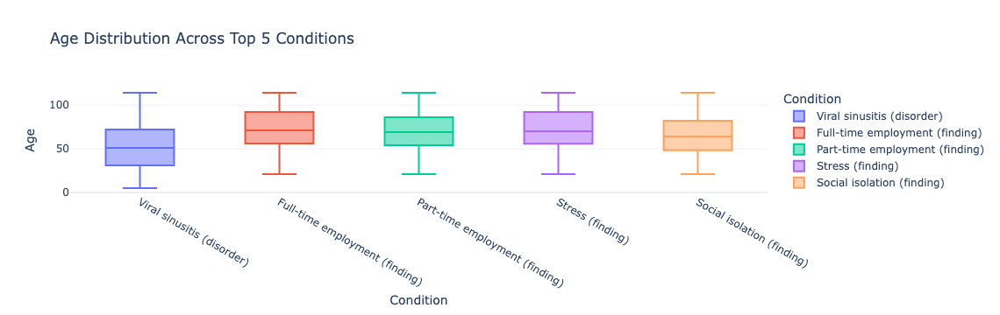

In [75]:
top_condition_list = top_conditions['Condition'].tolist()
filtered_conditions = merged_df[merged_df['DESCRIPTION'].isin(top_condition_list)]

fig_box = px.box(
    filtered_conditions,
    x='DESCRIPTION',
    y='AGE',
    color='DESCRIPTION',
    title='Age Distribution Across Top 5 Conditions',
    labels={'DESCRIPTION': 'Condition', 'AGE': 'Age'},
    template='plotly_white'
)
fig_box.show()

#### Exercise 6
**Prompt:**

Do certain conditions tend to appear in younger or older populations? Why might that be?

### 2.3 Scatter Plot — Timeline Viewer

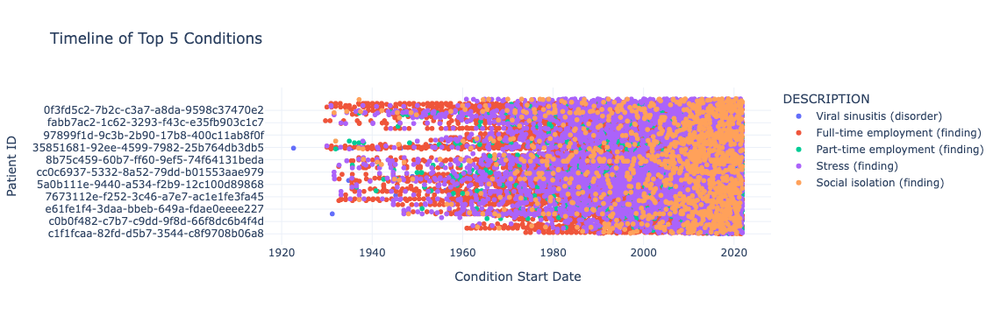

In [78]:
fig_timeline = px.scatter(
    filtered_conditions,
    x='START',
    y='PATIENT',
    color='DESCRIPTION',
    title='Timeline of Top 5 Conditions',
    labels={'START': 'Condition Start Date', 'PATIENT': 'Patient ID'},
    template='plotly_white'
)
fig_timeline.show()

Notice when some certain conditions arose.

For better readability and understanding, lets limmit it to 100 random patients.

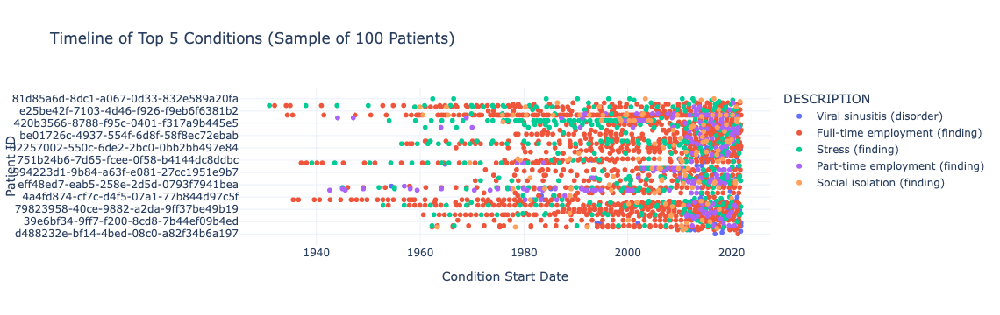

In [81]:
import numpy as np

# Step 1: Randomly sample 100 unique PATIENT IDs
sampled_patients = np.random.choice(filtered_conditions['PATIENT'].unique(), size=100, replace=False)

# Step 2: Filter the dataframe to include only those patients
sampled_df = filtered_conditions[filtered_conditions['PATIENT'].isin(sampled_patients)]

fig_timeline = px.scatter(
    sampled_df,
    x='START',
    y='PATIENT',
    color='DESCRIPTION',
    title='Timeline of Top 5 Conditions (Sample of 100 Patients)',
    labels={'START': 'Condition Start Date', 'PATIENT': 'Patient ID'},
    template='plotly_white'
)
fig_timeline.show()

### 2.4 groupby()

**Mini-Lesson: Using groupby to Summarize Conditions**

When working with health data, you often want to know things like:

> “What is the average age of patients diagnosed with each condition?”

To answer that, we can use groupby.

In [84]:
avg_age_per_condition = merged_df.groupby('DESCRIPTION')['AGE'].mean().reset_index()
avg_age_per_condition.columns = ['Condition', 'Average Age']
avg_age_per_condition.sort_values('Average Age', ascending=False).head(10)

,Condition,Average Age
128,Non-small cell carcinoma of lung TNM stage 2 ...,112.000000
153,Proliferative diabetic retinopathy due to type...,108.000000
11,Alzheimer's disease (disorder),101.891892
26,Carcinoma in situ of prostate (disorder),100.964286
125,Neoplasm of prostate,100.896552
117,Metastasis from malignant tumor of prostate (d...,100.400000
145,Pneumonia,97.235294
10,Alcoholism,97.000000
118,Microalbuminuria due to type 2 diabetes mellit...,96.000000
36,Chronic kidney disease stage 2 (disorder),96.000000


#### Exercise 7
**Challenge:**

Can you calculate the average age for each of the top 5 conditions and display it as a table?

> Hint: Try using .groupby() with .mean().

In [86]:
### Put your answer here.

In [87]:
avg_age_by_condition = filtered_conditions.groupby("DESCRIPTION")["AGE"].mean().reset_index()
avg_age_by_condition.columns = ["Condition", "Average Age"]
avg_age_by_condition

,Condition,Average Age
0,Full-time employment (finding),73.220427
1,Part-time employment (finding),70.443116
2,Social isolation (finding),65.822204
3,Stress (finding),72.297255
4,Viral sinusitis (disorder),52.351176


## Task 3 - Social Risk Factor Analysis

Before we begin we must prepare our data:

In [90]:
observations_df['DESCRIPTION'].dropna().to_list()

['Body Height',
 'Pain severity - 0-10 verbal numeric rating [Score] - Reported',
 'Body Weight',
 'Weight-for-length Per age and sex',
 'Head Occipital-frontal circumference',
 'Diastolic Blood Pressure',
 'Systolic Blood Pressure',
 'Heart rate',
 'Respiratory rate',
 'Leukocytes [#/volume] in Blood by Automated count',
 'Erythrocytes [#/volume] in Blood by Automated count',
 'Hemoglobin [Mass/volume] in Blood',
 'Hematocrit [Volume Fraction] of Blood by Automated count',
 'MCV [Entitic volume] by Automated count',
 'MCH [Entitic mass] by Automated count',
 'MCHC [Mass/volume] by Automated count',
 'Erythrocyte distribution width [Entitic volume] by Automated count',
 'Platelets [#/volume] in Blood by Automated count',
 'Platelet distribution width [Entitic volume] in Blood by Automated count',
 'Platelet mean volume [Entitic volume] in Blood by Automated count',
 'Tobacco smoking status NHIS',
 'Body Height',
 'Pain severity - 0-10 verbal numeric rating [Score] - Reported',
 'Body W

**Real-World Data Isn't Clean**

When working with real EHR or survey data, social risk factors are often phrased indirectly.

Rather than "homeless", you might find:
"Do you feel safe where you live?"
or
"What is your address?"

That’s why understanding data semantics is just as important as knowing how to code.

In [92]:
social_risk_keywords = ["safe where you currently live",
    "language are you most comfortable speaking",
    "housing situation today",
    "highest level of school",
    "education",
    "social risk"
]

 - We're creating a list of keywords that typically represent social risk factors in a patient's history.

 - These are things that could impact health outcomes — like housing insecurity, past incarceration, or combat exposure.

In [94]:
observations_df['DESCRIPTION'] = observations_df['DESCRIPTION'].astype(str)
social_risks = observations_df[observations_df['DESCRIPTION'].str.lower().str.contains('|'.join(social_risk_keywords))].copy()

 - We make sure all DESCRIPTION values in the observations_df are converted to strings (to avoid errors).

 - Then, we use .str.contains() with a joined pattern like "homeless|arrest|combat|..." to find rows that mention any of these keywords.

 - This gives us a filtered subset of the observations that relate to social risk indicators.

 - .copy() ensures we avoid SettingWithCopyWarnings by working with a fresh DataFrame.

In [96]:
social_risks = social_risks.merge(patients_df[['Id', 'GENDER', 'AGE']], 
                                  left_on='PATIENT', right_on='Id', how='left')

 - Now that we know which observations relate to social risks, we want to add demographic information for those patients.

 - We do a left merge:

   - From the social_risks DataFrame, we match each row's PATIENT value

   - With the Id column in the patients_df

 - We keep only the GENDER and AGE columns (to avoid clutter).

 - This allows us to explore how social risks vary by age and gender.

### 3.1 Table Preview: Patients with Social Risk Factors

The purpose of this is to get a feel for what kind of patients are flagged with risks like homelessness, arrest, etc.

In [100]:
social_risks[['PATIENT', 'DESCRIPTION', 'AGE', 'GENDER', 'VALUE']].drop_duplicates().head(10)

,PATIENT,DESCRIPTION,AGE,GENDER,VALUE
0,339144f8-50e1-633e-a013-f361391c4cff,Do you feel physically and emotionally safe wh...,27,M,Yes
1,339144f8-50e1-633e-a013-f361391c4cff,What is the highest level of school that you h...,27,M,High school diploma or GED
2,339144f8-50e1-633e-a013-f361391c4cff,What is your housing situation today?,27,M,I have housing
3,339144f8-50e1-633e-a013-f361391c4cff,What language are you most comfortable speaking?,27,M,Language other than English
28,217f95a3-4e10-bd5d-fb67-0cfb5e8ba075,Do you feel physically and emotionally safe wh...,31,M,No
29,217f95a3-4e10-bd5d-fb67-0cfb5e8ba075,What is the highest level of school that you h...,31,M,More than high school
30,217f95a3-4e10-bd5d-fb67-0cfb5e8ba075,What is your housing situation today?,31,M,I have housing
31,217f95a3-4e10-bd5d-fb67-0cfb5e8ba075,What language are you most comfortable speaking?,31,M,English
32,217f95a3-4e10-bd5d-fb67-0cfb5e8ba075,Do you feel physically and emotionally safe wh...,31,M,Yes
44,d488232e-bf14-4bed-08c0-a82f34b6a197,Do you feel physically and emotionally safe wh...,22,F,Yes


### 3.2 Bar Chart: Top Social Risk Factors

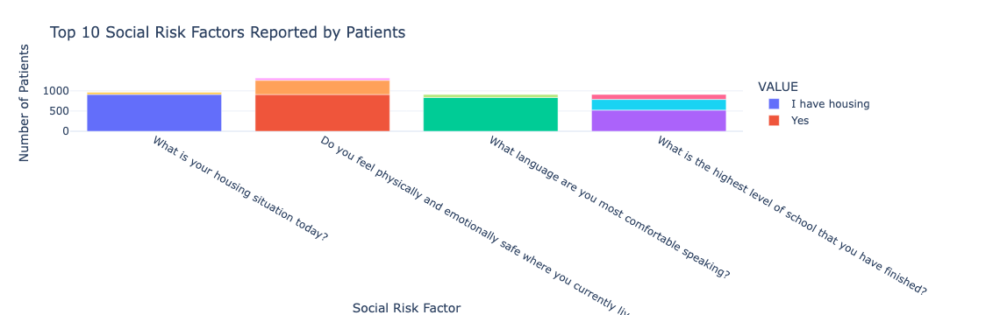

In [102]:
# Group by social risk DESCRIPTION and count unique patients
risk_counts = social_risks.groupby(['DESCRIPTION', 'VALUE'])['PATIENT'].nunique().reset_index(name='Count')

# Sort by count and get top 10
top_risks = risk_counts.sort_values(by='Count', ascending=False).head(10)
fig_risks = px.bar(top_risks, x='DESCRIPTION', y='Count', color='VALUE',
                   title='Top 10 Social Risk Factors Reported by Patients',
                   template='plotly_white',
                   labels={'DESCRIPTION': 'Social Risk Factor', 'Count': 'Number of Patients'})
fig_risks.show()

To better understand percentage distribution of each response (VALUE) within each social risk factor (DESCRIPTION), we will be creating a proportions table.

In [104]:
# Step 1: Count occurrences of each VALUE per DESCRIPTION
risk_counts = social_risks.groupby(['DESCRIPTION', 'VALUE']).size().reset_index(name='Count')

# Step 2: Calculate proportions (row-wise per DESCRIPTION)
risk_counts['Proportion'] = risk_counts.groupby('DESCRIPTION')['Count'].transform(lambda x: x / x.sum())

# Step 3: Convert proportions to percentage format
risk_counts['Proportion (%)'] = (risk_counts['Proportion'] * 100).round(2)

# Step 4: Sort and preview table
risk_counts = risk_counts.sort_values(['DESCRIPTION', 'Proportion'], ascending=[True, False])
risk_counts[['DESCRIPTION', 'VALUE', 'Count', 'Proportion (%)']].head(10)

,DESCRIPTION,VALUE,Count,Proportion (%)
3,Do you feel physically and emotionally safe wh...,Yes,8297,93.37
1,Do you feel physically and emotionally safe wh...,No,502,5.65
2,Do you feel physically and emotionally safe wh...,Unsure,58,0.65
0,Do you feel physically and emotionally safe wh...,I choose not to answer this question,29,0.33
7,What is the highest level of school that you h...,More than high school,4804,54.06
4,What is the highest level of school that you h...,High school diploma or GED,2572,28.94
6,What is the highest level of school that you h...,Less than high school degree,1464,16.48
5,What is the highest level of school that you h...,I choose not to answer this question,46,0.52
10,What is your housing situation today?,I have housing,8810,99.14
8,What is your housing situation today?,I choose not to answer this question,55,0.62


### 3.3 New Visualization: Gender Comparison

Compare the distribution of social risk factors between males and females.

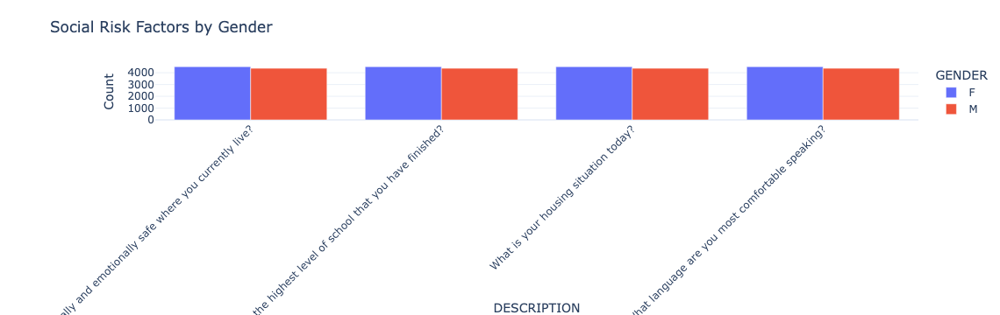

In [107]:
gender_counts = social_risks.groupby(['GENDER', 'DESCRIPTION']).size().reset_index(name='Count')

fig_gender = px.bar(gender_counts,
                    x='DESCRIPTION',
                    y='Count',
                    color='GENDER',
                    barmode='group',
                    title='Social Risk Factors by Gender',
                    template='plotly_white')

fig_gender.update_layout(xaxis_tickangle=-45)
fig_gender.show()

#### Exercise 8
**Prompt**:

Do any social risk factors exhibit a statistically significant difference in reporting frequency between genders?

How might you test this using the dataset (e.g., chi-square test or proportion comparison)?

 + Extra Thought: Could reporting bias or sample imbalance be influencing these differences?


### 3.4 Coding Challenge: Age Group Analysis

**Goal:**

Group patients with social risk factors into age buckets and determine how prevalence varies by age.

#### Exercise 9
**Challenge Promopt:**
 > How do social risk factors vary across different age groups?
 
 > Are certain age groups more vulnerable to specific social conditions like housing insecurity or emotional safety concerns?

**Hint**

Here is the starting code:

In [112]:
### bins = [0, 18, 30, 45, 60, 75, 100]
### labels = ['0-17', '18-29', '30-44', '45-59', '60-74', '75+']
### social_risks['AGE_GROUP'] = pd.cut(social_risks['AGE'], bins=bins, labels=labels)

# Put your answer here.

⬇Try it first! Then scroll for one possible solution.

In [114]:
bins = [0, 18, 30, 45, 60, 75, 100]
labels = ['0-17', '18-29', '30-44', '45-59', '60-74', '75+']
social_risks['AGE_GROUP'] = pd.cut(social_risks['AGE'], bins=bins, labels=labels)


age_group_counts = social_risks.groupby('AGE_GROUP')['PATIENT'].nunique().reset_index()
age_group_counts.columns = ['Age Group', 'Unique Patient Count']
age_group_counts

/var/folders/c7/mwgyyxds33bg8rksxm07_r_00000gn/T/ipykernel_2358/1311222635.py:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,Age Group,Unique Patient Count
0,0-17,0
1,18-29,132
2,30-44,188
3,45-59,222
4,60-74,184
5,75+,121


### 3.5 Pie Chart: Risk Factor Proportions

**Objective:**
Visualize the distribution of social risk factor types among all at-risk patient entries.


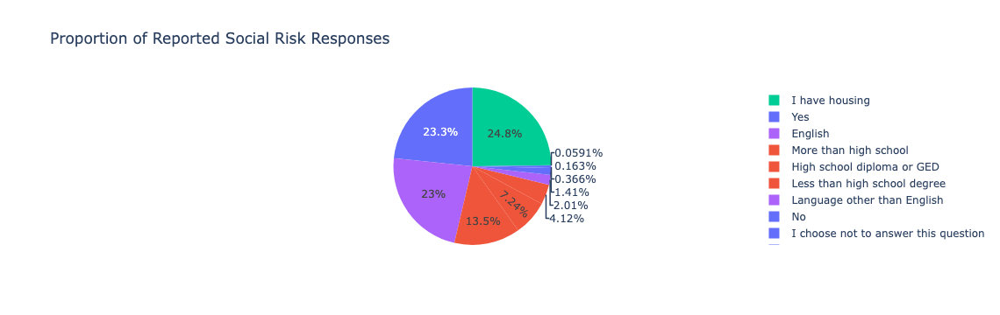

In [116]:
# Count combinations of risk factor and patient response
risk_counts = social_risks.groupby(['DESCRIPTION', 'VALUE']).size().reset_index(name='Count')

# Create pie chart from this more granular view
fig_pie = px.pie(
    risk_counts,
    names='VALUE',  # Show VALUE labels like "No", "Yes", etc.
    values='Count',
    color='DESCRIPTION',
    title='Proportion of Reported Social Risk Responses',
    template='plotly_white'
)
fig_pie.show()


Based on this graph, it is dificult to read what each key actually means. So let's start over by renaiming our keys.

In [118]:
value_label_map = {
    "I have housing": "Stable Housing",
    "I do not have housing": "Housing Insecure",
    "Yes": "Feels Safe",
    "No": "Does Not Feel Safe",
    "Unsure": "Unsure About Safety",
    "I choose not to answer this question": "Declined to Answer",
    "English": "English Speaker",
    "Language other than English": "Non-English Speaker",
    "More than high school": "Education > High School",
    "High school diploma or GED": "High School / GED",
    "Less than high school degree": "< High School"
}

Now let's apply the mapping to the dataframe!

In [120]:
social_risks['VALUE_CLEAN'] = social_risks['VALUE'].map(value_label_map).fillna(social_risks['VALUE'])

Now let's graph it once more!

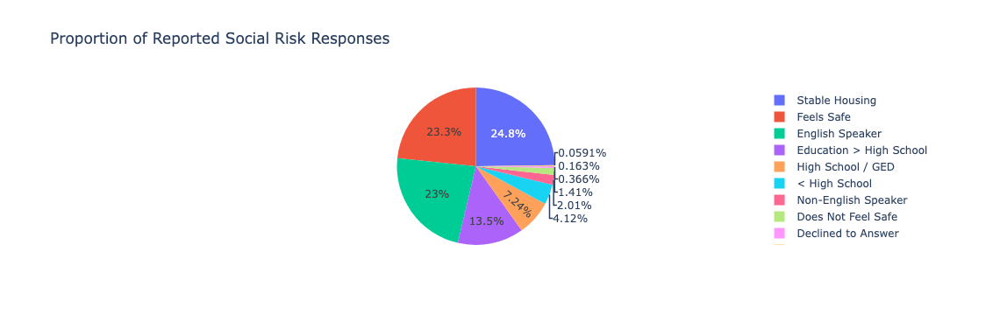

In [122]:
value_counts = social_risks['VALUE_CLEAN'].value_counts().reset_index()
value_counts.columns = ['Social Risk Response', 'Count']

fig = px.pie(
    value_counts,
    names='Social Risk Response',
    values='Count',
    title='Proportion of Reported Social Risk Responses',
    template='plotly_white'
)

fig.show()

#### Exercise 10
**Reflection Prompt:**

How might the imbalance in reported social risk responses—such as high rates of housing stability or English fluency—introduce bias into machine learning models trained to identify at-risk populations?

### Extra - Exploring Clinical Patterns Among Socially At-Risk Patients

Let's find out what are the most common conditions among at-risk patients

In [126]:
# Step 1: Merge conditions with social risk responses (already cleaned)
conditions_merged = conditions_df.merge(
    social_risks[['PATIENT', 'VALUE_CLEAN']], 
    on='PATIENT', 
    how='inner'
)

# Step 2: Group and count condition descriptions per social risk response
condition_counts = (
    conditions_merged
    .groupby(['VALUE_CLEAN', 'DESCRIPTION'])
    .size()
    .reset_index(name='Count')
)

# Step 3: For each VALUE_CLEAN, get top 5 conditions
top_conditions_by_risk = (
    condition_counts
    .sort_values(['VALUE_CLEAN', 'Count'], ascending=[True, False])
    .groupby('VALUE_CLEAN')
    .head(5)
    .reset_index(drop=True)
)

# Step 4 (Optional): Display results
pivot_table = top_conditions_by_risk.pivot_table(
    index='VALUE_CLEAN', 
    values='Count', 
    columns='DESCRIPTION', 
    aggfunc='first'
).fillna(0)

pivot_table

DESCRIPTION,Full-time employment (finding),Limited social contact (finding),Not in labor force (finding),Part-time employment (finding),Social isolation (finding),Stress (finding),Victim of intimate partner abuse (finding)
VALUE_CLEAN,,,,,,,
< High School,56418.0,0.0,8088.0,14989.0,0.0,25108.0,4528.0
Declined to Answer,4449.0,298.0,359.0,736.0,0.0,1541.0,0.0
Does Not Feel Safe,17922.0,0.0,1431.0,2839.0,1521.0,6145.0,0.0
Education > High School,131310.0,0.0,9977.0,20074.0,10310.0,45658.0,0.0
English Speaker,258978.0,0.0,21704.0,47635.0,21002.0,95234.0,0.0
Feels Safe,259219.0,0.0,21459.0,47282.0,21166.0,96104.0,0.0
High School / GED,90562.0,6098.0,0.0,15588.0,8261.0,32143.0,0.0
Housing Insecure,1125.0,41.0,56.0,137.0,0.0,322.0,0.0
Non-English Speaker,20903.0,0.0,0.0,3228.0,1919.0,8120.0,1544.0


## Task 4 - Custom Query Builder
Okay, now let’s explore how we can build flexible queries using our patient, condition, and observation data.

This is perfect for researchers who want to slice and dice the data by demographics, risks, and health profiles.

Before diving into deeper analysis, let’s combine our datasets to make querying easier.

We’re going to create a new DataFrame called `filtered_df` that merges key information from:
- **`patients_df`** – demographic details like age, gender, and healthcare expenses,
- **`conditions_df`** – medical conditions each patient has,
- **`social_risks`** – responses related to social determinants of health.

By joining these datasets, we can create flexible filters and groupings based on social risk, demographics, and health outcomes. This will allow us to:
- Compare healthcare usage across social risk categories,
- Identify condition patterns among different populations,
- Explore targeted insights based on gender, age, or specific risk factors.

Let’s start by building this merged dataset 👇

In [129]:
# Merge patients, conditions, and social risk responses into one DataFrame
filtered_df = (
    conditions_df
    .merge(patients_df[['Id', 'AGE', 'GENDER', 'HEALTHCARE_EXPENSES', 'RACE']], left_on='PATIENT', right_on='Id', how='inner')
    .merge(social_risks[['PATIENT', 'VALUE_CLEAN']], on='PATIENT', how='inner')
)

Now let's build a summary table that shows average age, average healthcare expenses, and patient count for each social risk type and gender.

### 4.1 Grouped Summary Table: Demographics + Risks
 > Let’s start by building a summary table that shows average age, average healthcare expenses, and patient count for each social risk type and gender

In [132]:
# Grouped summary: average age and healthcare expenses by social risk and gender
grouped_summary = (
    filtered_df
    .groupby(['VALUE_CLEAN', 'RACE'])
    .agg(
        Avg_Age=('AGE', 'mean'),
        Avg_Expense=('HEALTHCARE_EXPENSES', 'mean'),
        Patient_Count=('PATIENT', 'nunique')
    )
    .reset_index()
)

# Format Avg_Expense with commas and dollar signs
grouped_summary['Avg_Expense'] = grouped_summary['Avg_Expense'].apply(lambda x: f"${x:,.0f}")  # Making average expense more readable

grouped_summary

,VALUE_CLEAN,RACE,Avg_Age,Avg_Expense,Patient_Count
0,< High School,asian,88.994489,"$2,453,725",13
1,< High School,black,67.076520,"$2,151,796",8
2,< High School,hawaiian,41.000000,"$799,294",2
3,< High School,native,27.000000,"$217,674",1
4,< High School,white,83.392025,"$1,396,524",99
5,Declined to Answer,asian,74.857143,"$1,877,320",5
6,Declined to Answer,black,101.547436,"$10,591,364",12
7,Declined to Answer,hawaiian,52.000000,"$1,746,837",1
8,Declined to Answer,white,75.558270,"$2,641,366",97
9,Does Not Feel Safe,asian,79.390207,"$1,892,365",26


#### Exercise 11
**Prompt:**
Are any risk groups associated with significantly higher average healthcare expenses?
Try comparing different races averages within the same risk category.

In [134]:
### Put your answer here

### 4.2🌡️ Heatmap: Conditions by Gender
 > Okay, now let’s explore which conditions are more prevalent by gender. A heatmap helps us visualize how frequently each diagnosis appears.

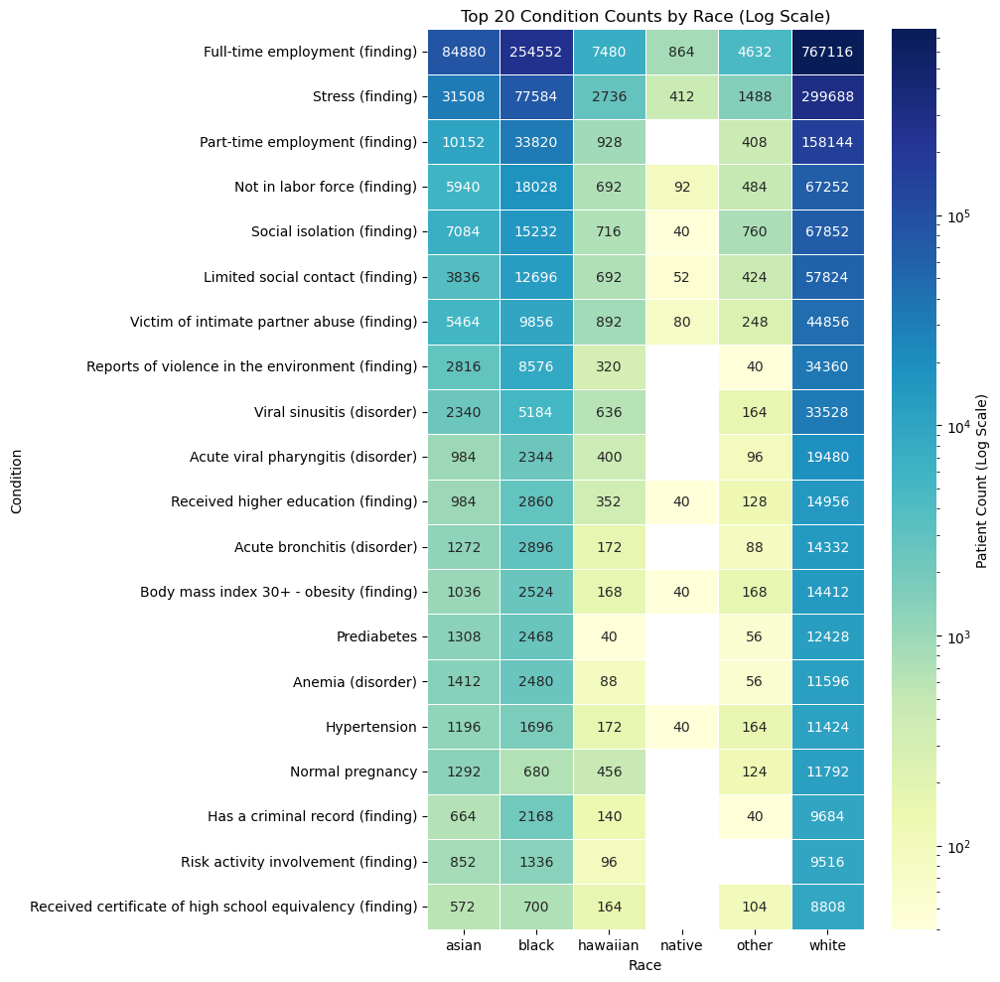

In [136]:
# Step 1: Pivot condition counts by RACE
heatmap_df_race = (
    filtered_df
    .groupby(['RACE', 'DESCRIPTION'])
    .size()
    .reset_index(name='Count')
    .pivot(index='DESCRIPTION', columns='RACE', values='Count')
    .fillna(0)
)

# Optional: Focus on top 20 conditions across all races
top_conditions_race = heatmap_df_race.sum(axis=1).sort_values(ascending=False).head(20).index
heatmap_df_race_top = heatmap_df_race.loc[top_conditions_race]

# Step 2: Plot the heatmap
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

plt.figure(figsize=(10, 10))
sns.heatmap(
    heatmap_df_race_top,
    cmap='YlGnBu',
    annot=True,
    fmt='.0f',
    linewidths=.5,
    norm=LogNorm(),  # Apply log scale
    cbar_kws={'label': 'Patient Count (Log Scale)'}
)

plt.title('Top 20 Condition Counts by Race (Log Scale)')
plt.xlabel('Race')
plt.ylabel('Condition')
plt.tight_layout()
plt.show()

#### Exercise 12
**Coding Prompt:**

Can you modify the code to show the top 10 most common conditions by gender only? Try filtering heatmap_df before plotting.

In [138]:
### Put your answer here.

### 4.3 🌲 Treemap: Conditions by Risk Response
 > Let’s explore a treemap that shows the breakdown of health conditions under each social risk type. This visualization gives you a quick sense of volume and diversity.

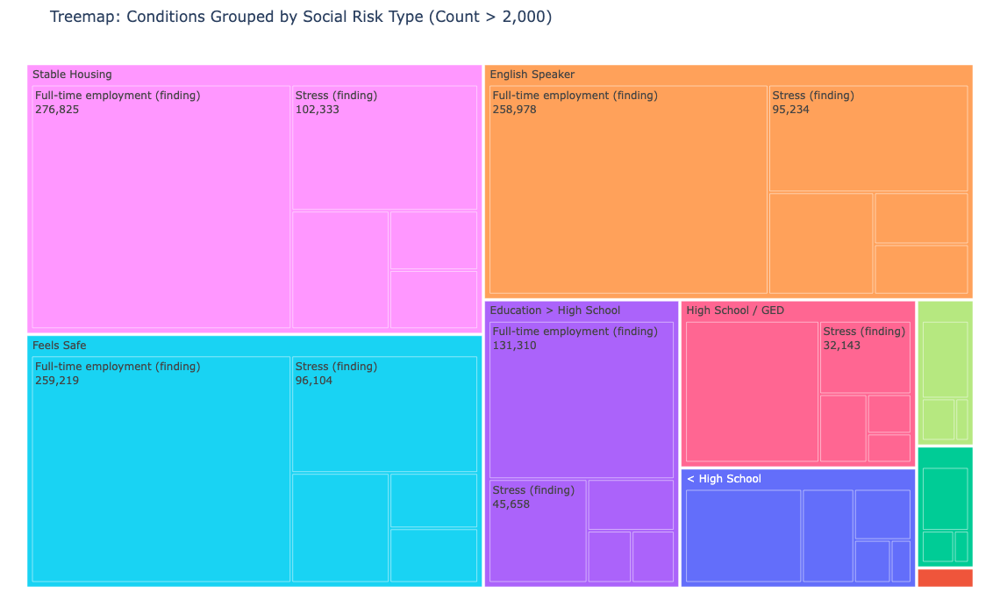

In [140]:
filtered_treemap_df = top_conditions_by_risk[top_conditions_by_risk['Count'] > 2000]

fig = px.treemap(
    filtered_treemap_df,
    path=['VALUE_CLEAN', 'DESCRIPTION'],
    values='Count',
    title='Treemap: Conditions Grouped by Social Risk Type (Count > 2,000)',
    color='VALUE_CLEAN'
)

# Improve readability
fig.update_traces(
    textinfo='label+value',
    hovertemplate='<b>%{label}</b><br>Count: %{value}<extra></extra>',
    marker=dict(line=dict(width=0.5, color='white'))
)
fig.update_layout(
    uniformtext=dict(minsize=10, mode='hide'),
    margin=dict(t=50, l=25, r=25, b=25),
    height=700
)

fig.show()

#### Exercise 13
**Engaging Question:**

Do certain social risk responses (like housing or education) appear to be associated with more diverse or more severe health conditions?

### 4.4 Line Graph: Average Healthcare Expense Over Age by Social Risk
> This line chart will show how average healthcare expenses change with age, split by social risk factor (VALUE_CLEAN). This adds a temporal or continuous element to your analysis — perfect for a line plot.

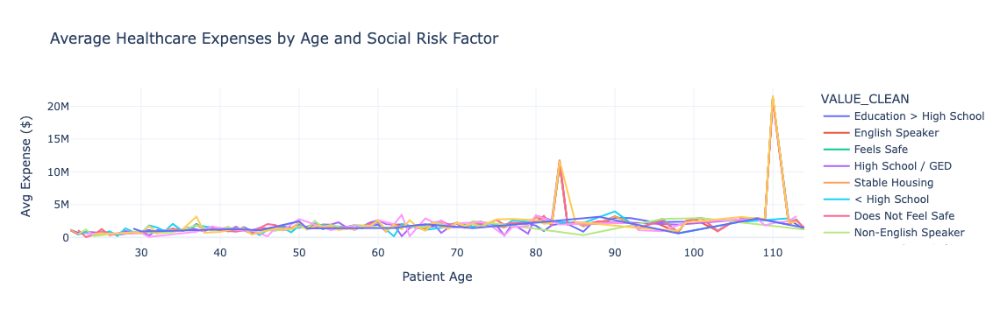

In [143]:
age_expense_trend = (
    filtered_df.groupby(['AGE', 'VALUE_CLEAN'])['HEALTHCARE_EXPENSES']
    .mean()
    .reset_index()
)

fig = px.line(
    age_expense_trend,
    x='AGE',
    y='HEALTHCARE_EXPENSES',
    color='VALUE_CLEAN',
    title='Average Healthcare Expenses by Age and Social Risk Factor',
    labels={'HEALTHCARE_EXPENSES': 'Avg Expense ($)', 'AGE': 'Patient Age'},
    template='plotly_white'
)
fig.update_layout(hovermode="x unified")
fig.show()


### 4.5 Text-Based Condition Query: Simulated Search Bar
> Okay, now let’s explore how you might create a search box style filter for diagnoses using a keyword. Think of it like building a custom filter tool.

In [145]:
search_keyword = "stress"
search_results = filtered_df[
    filtered_df['DESCRIPTION'].str.contains(search_keyword, case=False, na=False)
]

search_results[['PATIENT', 'AGE', 'GENDER', 'DESCRIPTION']].drop_duplicates().head(10)

,PATIENT,AGE,GENDER,DESCRIPTION
252,339144f8-50e1-633e-a013-f361391c4cff,27,M,Stress (finding)
604,217f95a3-4e10-bd5d-fb67-0cfb5e8ba075,31,M,Stress (finding)
876,23d16ee3-8cd4-eeb8-e77e-1e5fbf4c4159,34,M,Stress (finding)
1148,aade3c61-92bd-d079-9d28-0b2b7fde0fbb,40,M,Stress (finding)
1452,0288c42c-43a1-9878-4a9d-6b96caa12c40,45,F,Stress (finding)
2180,61a2fcc0-d679-764c-7d86-b885b2c4907f,32,F,Stress (finding)
2276,c0219ca9-576f-f7c2-9c44-de030e94969b,53,F,Stress (finding)
3240,cb8c092a-99aa-6c9c-1ec1-660f0b00549d,34,F,Stress (finding)
3404,97a20cf9-630d-939c-2f50-f13c434aee2f,41,F,Stress (finding)
3872,55a6a46e-a1a4-0298-e58f-c0cb27cbb022,66,F,Stress (finding)


**Your Turn:**

Try searching for other keywords like "anxiety", "injury", or "hypertension" and analyze the age and gender patterns.
Which groups are most affected?

#### 4.6 📊 Table 1 Summary Statistics**

In clinical research, it's common to generate a **Table 1** to compare demographic and clinical variables across groups. Here, we're comparing age, gender, race, and condition description across different social risk categories.

This is made easy with the `tableone` package, which automatically handles categorical and continuous variables and provides p-values for group comparisons.

In [248]:
from tableone import TableOne

# Define columns to summarize
columns = ['AGE', 'GENDER', 'RACE', 'VALUE_CLEAN']
categorical = ['GENDER', 'RACE', 'VALUE_CLEAN']

# Create TableOne grouped by condition description
table_by_condition = TableOne(
    filtered_df,
    columns=columns,
    categorical=categorical,
    groupby='DESCRIPTION',
    pval=True
)

table_by_condition


Grouped by DESCRIPTION                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          